
# <a id='toc1_'></a>[ ](#toc0_)
|
$\LARGE \textbf{\textcolor{red}{ Computational Screening of GDB-9 Molecules for Organic Semiconductors}}$
|
---

 ###  **MVOTO KONGO Patrick Sorrel**, sorrel.mvoto@facsciences-uy1.cm

 
* Department of Physics, Faculty of Science, University of Yaounde I,  Ph.D Candidate
* AtomiC Molecular Physics et Biophysics
  
18 JANVIER 2025

---

<table width="100%"><tr style="background-color:white;">
    <td style="text-align:left;padding:0px;width:142px'">
        <a href="https://qworld.net" target="_blank">
            <img src="images/QC.jpg"></a></td>
            <img src="images/ML.jpeg"></a></td>
    <td width="*">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;</td>
    <!-- ############################################# -->
    <td style="padding:0px;width:40px;">
        <a href="https://github.com/GitNindjapatrick/" target="_blank">
        <img align="right" src="images/github.png" width="40px"></a> </td>
    <td style="padding:0px;width:5px;"></td>
    <td style="padding:0px;width:40px;">
        <a href="https://linkedin.com/in/patrick-sorrel-mvoto-kongo-641a41273" target="_blank">
        <img align="right" src="images/LinkedIn.png"></a></td>
    <td style="padding:0px;width:5px;"></td>
    <!-- ############################################# -->
    <td style="padding:0px;width:40px;">
        <a href="https://discord.MVOTO.net"
           target="_blank">
        <img align="right" src="images/discord.jpeg"></a></td>
</tr></table>


[Assessing the Synthetic Compatibility of GDB-9 Molecules with PCBM and PCDTBT for Organic Solar Cells: A Computational Approach](First_test_result.ipynb) &nbsp;|&nbsp;
[Computational Screening of GDB-9 Molecules for Organic Semiconductors](MVOTO_EXTRACTION_GDB.ipynb)&nbsp;|&nbsp;
[PCE: Designing Organic Donor and Acceptor Molecules for Photovoltaic Devices](PCE_GDB9.ipynb) &nbsp;|&nbsp;
|[gdb9: Openbabel xTB-crest and Pyscf Quantum Chemistry Calculations Assessment](MVOTO_PROPRIETES.ipynb)&nbsp;|&nbsp;




## 1. Introduction
Organic semiconductors are increasingly studied due to their potential in flexible and low-cost electronic devices. This notebook explores the GDB-9 molecular database to identify candidates for organic semiconductors based on their HOMO-LUMO gaps and other electronic properties.

### Objectives:
- Analyze the HOMO-LUMO gap of GDB-9 molecules.
- Evaluate their potential as organic semiconductors using selection criteria inspired by CEPDB.

---

## 2. Methodology

### 2.1 Selection Criteria
The following criteria, inspired by CEPDB, are used to filter molecules:
- **HOMO-LUMO Gap**: Between 0.8 eV and 1.5 eV.
- **Stability**: Ionization potential (IP) and electron affinity (EA) within acceptable ranges.
- **Dipole Moment**: Below 5 Debye for better charge transport.

### 2.2 Computational Tools
- **Software**: PySCF for DFT calculations, xTB CREST for molecular dynamics.
- **Functional**: B3LYP with 6-31G(2df,p) basis set.
- **Analysis**:
  - HOMO-LUMO gap calculation.
  - Binding energy and charge transfer analysis.
  - Molecular dynamics simulations in solvents like chloroform or toluene.

---

## 3. Results and Discussion

### 3.1 Electronic Properties
- HOMO-LUMO levels are visualized to assess energy alignment with standard acceptor materials like PCBM.
- Ionization potential and electron affinity are calculated to predict charge transfer feasibility.

### 3.2 Stability Analysis
- Binding energies between GDB-9 molecules and PCBM/PCDTBT are computed.
- Non-covalent interactions (e.g., π-π stacking) are analyzed using NCI plots.

### 3.3 Charge Transfer Efficiency
- Charge transfer integrals are computed to estimate electronic coupling.
- Transition dipole moments and reorganization energies are analyzed for exciton dissociation efficiency.


---

## References
1. [CEPDB Database](https://cepdb.org)
2. Relevant DOI references (e.g., [1], [3])


In [40]:
import pandas as pd

# Chargement de la base de données
input_file = "validationGDB9.csv"  # Nom de votre fichier d'entrée
output_csv = "filtered_molecules.csv"  # Nom du fichier CSV de sortie
output_pkl = "filtered_molecules.pkl"  # Nom du fichier PKL de sortie

data = pd.read_csv(input_file)
print(f"Nombre total de molécules dans la base : {len(data)}")

# Critères de sélection
GAP_MIN = -1.49   # Gap énergétique minimal en eV
GAP_MAX = 3.8     # Gap énergétique maximal en eV
LUMO_MIN = -6.09  # LUMO minimal en eV
LUMO_MAX = -1.15  # LUMO maximal en eV
HOMO_MIN = -7.51  # HOMO minimal en eV
HOMO_MAX = -3.63  # HOMO maximal en eV
SCHARBER_GAP_MIN = -1.49  # Gap minimal pour le modèle de Scharber en eV
SCHARBER_GAP_MAX = 3.8    # Gap maximal pour le modèle de Scharber en eV

# Vérification des colonnes attendues
required_columns = ["HOMO(eV)", "LUMO(eV)", "Gap(eV)"]
for col in required_columns:
    if col not in data.columns:
        raise ValueError(f"La colonne '{col}' est manquante dans le fichier CSV.")

# Ajout du gap pour le modèle de Scharber
data["Scharber_Gap(eV)"] = data["Gap(eV)"]

# Étape 1 : Filtrer selon le HOMO
filtered_homo = data[(data["HOMO(eV)"] >= HOMO_MIN) & (data["HOMO(eV)"] <= HOMO_MAX)]
print(f"Nombre de molécules après filtrage HOMO : {len(filtered_homo)}")

# Étape 2 : Filtrer selon le LUMO
filtered_lumo = filtered_homo[(filtered_homo["LUMO(eV)"] >= LUMO_MIN) & (filtered_homo["LUMO(eV)"] <= LUMO_MAX)]
print(f"Nombre de molécules après filtrage LUMO : {len(filtered_lumo)}")

# Étape 3 : Filtrer selon le Gap énergétique
filtered_gap = filtered_lumo[
    (filtered_lumo["Gap(eV)"] >= GAP_MIN) & 
    (filtered_lumo["Gap(eV)"] <= GAP_MAX)
]
print(f"Nombre de molécules après filtrage Gap énergétique : {len(filtered_gap)}")

# Étape 4 : Filtrer selon le Gap pour le modèle de Scharber
filtered_scharber = filtered_gap[
    (filtered_gap["Scharber_Gap(eV)"] >= SCHARBER_GAP_MIN) & 
    (filtered_gap["Scharber_Gap(eV)"] <= SCHARBER_GAP_MAX)
]
print(f"Nombre de molécules après filtrage Scharber Gap : {len(filtered_scharber)}")

# Création explicite d'un DataFrame final
final_dataframe = filtered_scharber.copy()

# Enregistrer les molécules filtrées dans les fichiers
final_dataframe.to_csv(output_csv, index=False)
final_dataframe.to_pickle(output_pkl)

# Afficher un aperçu des données finales
print("\nAperçu des molécules filtrées :")
print(final_dataframe.head())



Nombre total de molécules dans la base : 133885
Nombre de molécules après filtrage HOMO : 127991
Nombre de molécules après filtrage LUMO : 14765
Nombre de molécules après filtrage Gap énergétique : 524
Nombre de molécules après filtrage Scharber Gap : 524

Aperçu des molécules filtrées :
     smiles_key          smiles    HOMO    LUMO     Gap  HOMO(eV)  LUMO(eV)  \
325     gdb 326     O=CC(=O)C=O -0.2606 -0.1455  0.1151 -7.091287 -3.959257   
722     gdb 723     C1=NN=CN=N1 -0.2475 -0.1121  0.1355 -6.734818 -3.050396   
1586   gdb 1587  CC(=O)C(=O)C=O -0.2489 -0.1149  0.1340 -6.772914 -3.126588   
1588   gdb 1589  NC(=O)C(=O)C=O -0.2482 -0.1217  0.1265 -6.753866 -3.311626   
2114   gdb 2115    O=C1CC=CC1=O -0.2347 -0.0951  0.1396 -6.386512 -2.587803   

       Gap(eV)  Scharber_Gap(eV)  
325   3.132031          3.132031  
722   3.687143          3.687143  
1586  3.646326          3.646326  
1588  3.442240          3.442240  
2114  3.798709          3.798709  


In [2]:
from rdkit import Chem
from rdkit.Chem import AllChem, Descriptors, DataStructs

import numpy as np

def calculate_fingerprint(smiles, radius=3, nBits=512):
    """
    Calcule un Morgan Fingerprint pour une molécule donnée.
    """
    mol = Chem.MolFromSmiles(smiles)
    if mol:
        fp = AllChem.GetMorganFingerprintAsBitVect(mol, radius=radius, nBits=nBits)
        return np.array(fp)  # Convertir en tableau numpy pour l'analyse
    else:
        return None

# Chargement des molécules sélectionnées
data_file = "filtered_molecules.csv"  # Remplacez par le chemin de votre fichier .pkl
selected_molecules = pd.read_csv(data_file)

selected_molecules.to_pickle("filtered_molecules.pkl")
# Calcul des fingerprints
selected_molecules['Fingerprint'] = selected_molecules['smiles'].apply(calculate_fingerprint)

print("Fingerprints calculés avec succès.")


Fingerprints calculés avec succès.


In [42]:
selected_molecules

,smiles_key,smiles,HOMO,LUMO,Gap,HOMO(eV),LUMO(eV),Gap(eV),Scharber_Gap(eV),Fingerprint
0,gdb 326,O=CC(=O)C=O,-0.2606,-0.1455,0.1151,-7.091287,-3.959257,3.132031,3.132031,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, ..."
1,gdb 723,C1=NN=CN=N1,-0.2475,-0.1121,0.1355,-6.734818,-3.050396,3.687143,3.687143,"[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
2,gdb 1587,CC(=O)C(=O)C=O,-0.2489,-0.1149,0.1340,-6.772914,-3.126588,3.646326,3.646326,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
3,gdb 1589,NC(=O)C(=O)C=O,-0.2482,-0.1217,0.1265,-6.753866,-3.311626,3.442240,3.442240,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
4,gdb 2115,O=C1CC=CC1=O,-0.2347,-0.0951,0.1396,-6.386512,-2.587803,3.798709,3.798709,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, ..."
...,...,...,...,...,...,...,...,...,...,...
519,gdb 133853,OC12C3C1N1CC3N=C21,-0.2087,-0.0889,0.1198,-5.679016,-2.419092,3.259924,3.259924,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, ..."
520,gdb 133854,CC12CC34CC=C(C13)C24,-0.1575,-0.0912,0.0663,-4.285793,-2.481678,1.804115,1.804115,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
521,gdb 133858,CC1N2C3C4=CCC13C24,-0.1693,-0.1041,0.0652,-4.606888,-2.832705,1.774182,1.774182,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
522,gdb 133864,C1C2CC3OC4CC1C234,-0.1386,-0.0638,0.0747,-3.771498,-1.736086,2.032691,2.032691,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."


In [44]:
from mordred import Calculator, descriptors

def calculate_mordred_descriptors(smiles):
    """
    Calcule des descripteurs Mordred pour une molécule donnée.
    """
    mol = Chem.MolFromSmiles(smiles)
    calc = Calculator(descriptors, ignore_3D=True)
    return calc(mol)

# Calcul des descripteurs pour toutes les molécules
selected_molecules['Mordred_Descriptors'] = selected_molecules['smiles'].apply(calculate_mordred_descriptors)

# Convertir les descripteurs Mordred en DataFrame
mordred_df = pd.DataFrame(selected_molecules['Mordred_Descriptors'].tolist(), index=selected_molecules.index)
print("Descripteurs Mordred calculés avec succès.")


Descripteurs Mordred calculés avec succès.


In [45]:
mordred_df

,0,1,2,3,4,5,6,7,8,9,...,1603,1604,1605,1606,1607,1608,1609,1610,1611,1612
0,module 'numpy' has no attribute 'float'.\n`np....,module 'numpy' has no attribute 'float'.\n`np....,0,0,6.898979,1.931852,3.863703,6.898979,1.149830,2.595800,...,7.280008,29.753427,86.000394,10.750049,31,4,20.0,19.0,3.611111,1.666667
1,module 'numpy' has no attribute 'float'.\n`np....,module 'numpy' has no attribute 'float'.\n`np....,0,0,8.000000,2.000000,4.000000,8.000000,1.333333,2.687624,...,7.627057,30.941317,82.027946,10.253493,27,3,24.0,24.0,1.500000,1.500000
2,module 'numpy' has no attribute 'float'.\n`np....,module 'numpy' has no attribute 'float'.\n`np....,0,0,7.662988,2.052881,4.105762,7.662988,1.094713,2.766317,...,7.890957,32.688753,100.016044,9.092368,46,6,26.0,26.0,4.472222,1.777778
3,module 'numpy' has no attribute 'float'.\n`np....,module 'numpy' has no attribute 'float'.\n`np....,0,0,7.662988,2.052881,4.105762,7.662988,1.094713,2.766317,...,7.890957,32.688753,101.011293,10.101129,46,6,26.0,26.0,4.472222,1.777778
4,module 'numpy' has no attribute 'float'.\n`np....,module 'numpy' has no attribute 'float'.\n`np....,0,0,8.428639,2.214320,4.214320,8.428639,1.204091,2.862063,...,8.302762,47.572444,96.021129,8.729194,40,5,32.0,35.0,2.972222,1.611111
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
519,module 'numpy' has no attribute 'float'.\n`np....,module 'numpy' has no attribute 'float'.\n`np....,0,2,12.872334,2.895585,5.233767,12.872334,1.430259,3.423255,...,10.759922,66.384029,122.048013,8.136534,67,5,70.0,100.0,2.118056,1.611111
520,module 'numpy' has no attribute 'float'.\n`np....,module 'numpy' has no attribute 'float'.\n`np....,0,0,11.538368,2.961601,5.846497,11.538368,1.282041,3.433460,...,11.430250,62.143269,118.078250,6.214645,70,6,72.0,104.0,2.208333,1.597222
521,module 'numpy' has no attribute 'float'.\n`np....,module 'numpy' has no attribute 'float'.\n`np....,0,1,11.591006,2.938927,5.796137,11.591006,1.287890,3.424717,...,11.345512,61.908503,119.073499,6.615194,71,7,70.0,102.0,2.118056,1.680556
522,module 'numpy' has no attribute 'float'.\n`np....,module 'numpy' has no attribute 'float'.\n`np....,0,0,11.313708,2.828427,5.656854,11.313708,1.257079,3.390833,...,11.092321,44.269937,122.073165,6.424903,72,8,68.0,96.0,1.506944,1.666667


In [46]:
# Nettoyage des descripteurs
mordred_df = mordred_df.select_dtypes(exclude=["object"])  # Supprimer les colonnes non numériques
mordred_df.dropna(axis=1, how='any', inplace=True)  # Supprimer les colonnes avec des NaN
mordred_df = mordred_df.loc[:, mordred_df.var() > 0]  # Supprimer les colonnes invariantes


In [47]:
mordred_df

,2,3,4,5,6,7,8,9,10,11,...,1603,1604,1605,1606,1607,1608,1609,1610,1611,1612
0,0,0,6.898979,1.931852,3.863703,6.898979,1.149830,2.595800,2.300795,0.383466,...,7.280008,29.753427,86.000394,10.750049,31,4,20.0,19.0,3.611111,1.666667
1,0,0,8.000000,2.000000,4.000000,8.000000,1.333333,2.687624,2.449490,0.408248,...,7.627057,30.941317,82.027946,10.253493,27,3,24.0,24.0,1.500000,1.500000
2,0,0,7.662988,2.052881,4.105762,7.662988,1.094713,2.766317,2.459832,0.351405,...,7.890957,32.688753,100.016044,9.092368,46,6,26.0,26.0,4.472222,1.777778
3,0,0,7.662988,2.052881,4.105762,7.662988,1.094713,2.766317,2.459832,0.351405,...,7.890957,32.688753,101.011293,10.101129,46,6,26.0,26.0,4.472222,1.777778
4,0,0,8.428639,2.214320,4.214320,8.428639,1.204091,2.862063,2.544200,0.363457,...,8.302762,47.572444,96.021129,8.729194,40,5,32.0,35.0,2.972222,1.611111
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
519,0,2,12.872334,2.895585,5.233767,12.872334,1.430259,3.423255,2.871158,0.319018,...,10.759922,66.384029,122.048013,8.136534,67,5,70.0,100.0,2.118056,1.611111
520,0,0,11.538368,2.961601,5.846497,11.538368,1.282041,3.433460,2.842409,0.315823,...,11.430250,62.143269,118.078250,6.214645,70,6,72.0,104.0,2.208333,1.597222
521,0,1,11.591006,2.938927,5.796137,11.591006,1.287890,3.424717,2.833810,0.314868,...,11.345512,61.908503,119.073499,6.615194,71,7,70.0,102.0,2.118056,1.680556
522,0,0,11.313708,2.828427,5.656854,11.313708,1.257079,3.390833,2.914214,0.323802,...,11.092321,44.269937,122.073165,6.424903,72,8,68.0,96.0,1.506944,1.666667


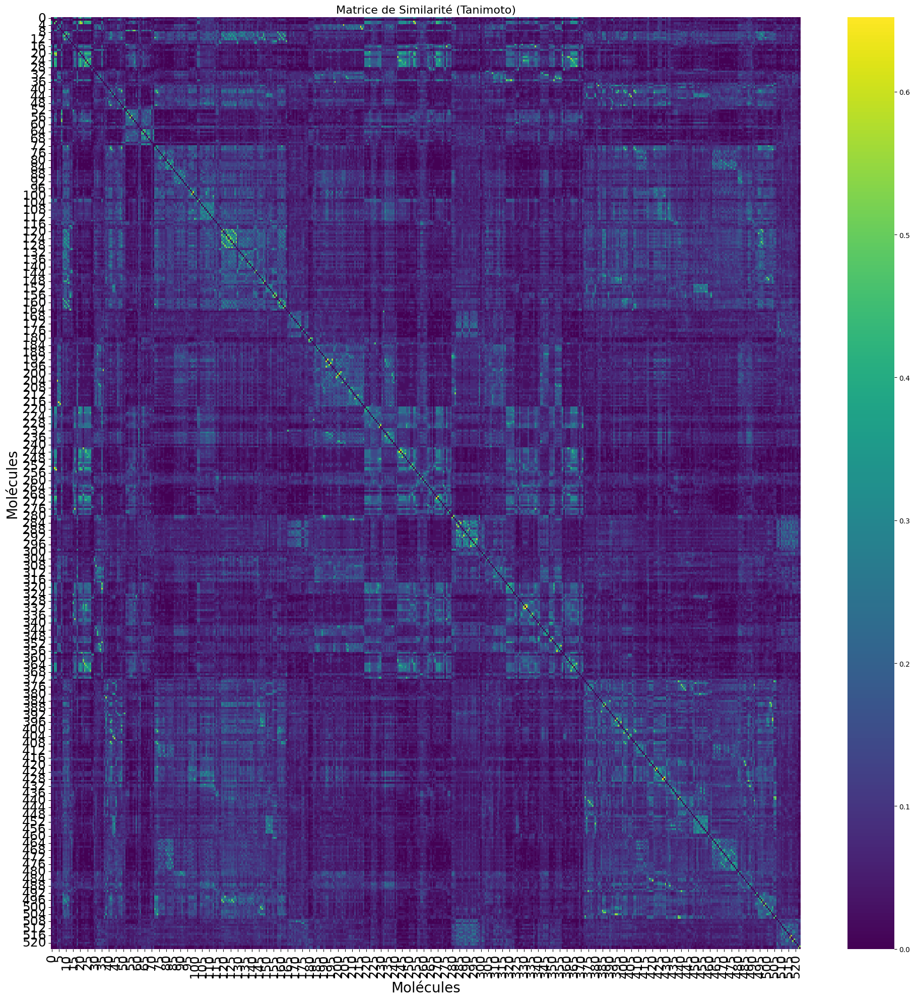

In [56]:
# Afficher une matrice de similarité avec une taille augmentée
import seaborn as sns
import matplotlib.pyplot as plt

# Définir la taille de la figure (largeur, hauteur en pouces)
plt.figure(figsize=(24, 24))  # Ajustez les dimensions selon vos besoins

sns.heatmap(similarity_matrix, cmap="viridis", annot=False)  # annot=True pour afficher les valeurs
plt.title("Matrice de Similarité (Tanimoto)", fontsize=16)  # Augmentez la taille de la police du titre
plt.xlabel("Molécules", fontsize=20)  # Augmentez la taille de la police de l'axe X
plt.ylabel("Molécules", fontsize=20)  # Augmentez la taille de la police de l'axe Y
plt.xticks(fontsize=18)  # Taille des labels de l'axe X
plt.yticks(fontsize=18)  # Taille des labels de l'axe Y

# Afficher le graphique
plt.show()




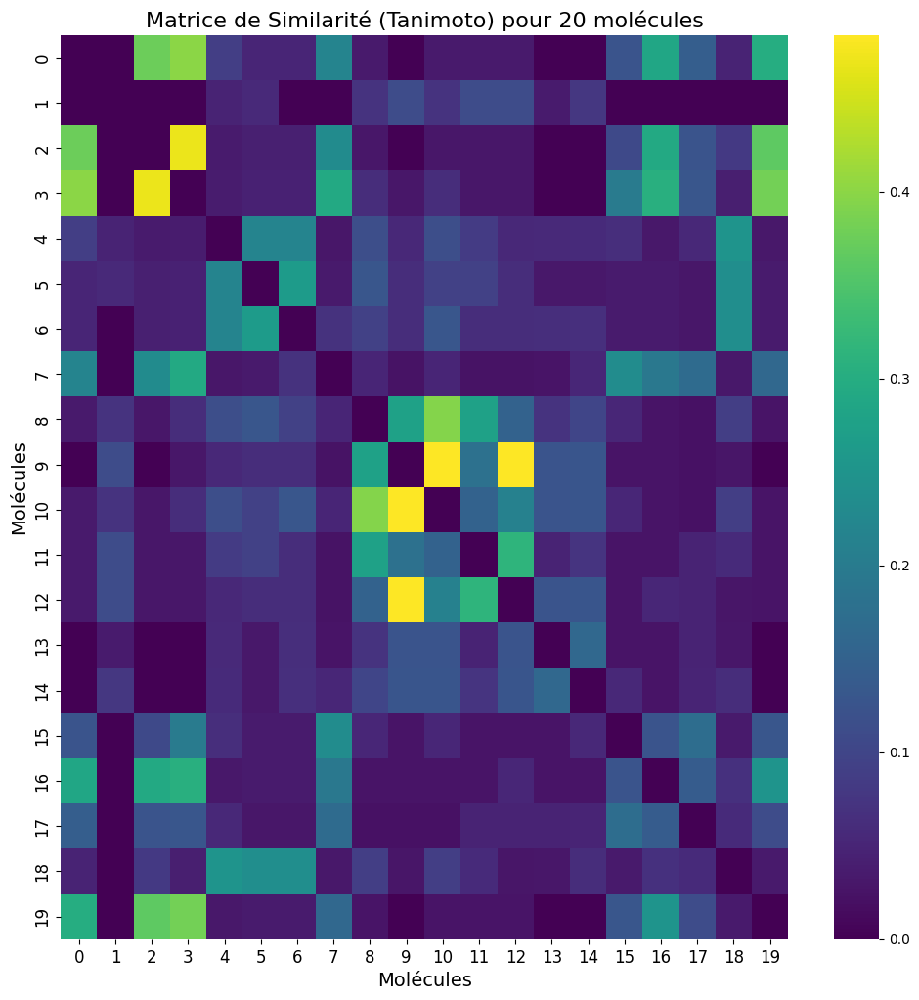

In [69]:
# Réduire la taille de la matrice (exemple : 100 premières molécules)
subset_size = 20  # Ajustez selon vos besoins
similarity_matrix_subset = similarity_matrix[:subset_size, :subset_size]


# Affichage de la matrice pour le sous-ensemble
plt.figure(figsize=(12, 12))  # Taille adaptée au sous-ensemble
sns.heatmap(similarity_matrix_subset, cmap="viridis", annot=False)
plt.title(f"Matrice de Similarité (Tanimoto) pour {subset_size} molécules", fontsize=16)
plt.xlabel("Molécules", fontsize=14)
plt.ylabel("Molécules", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()


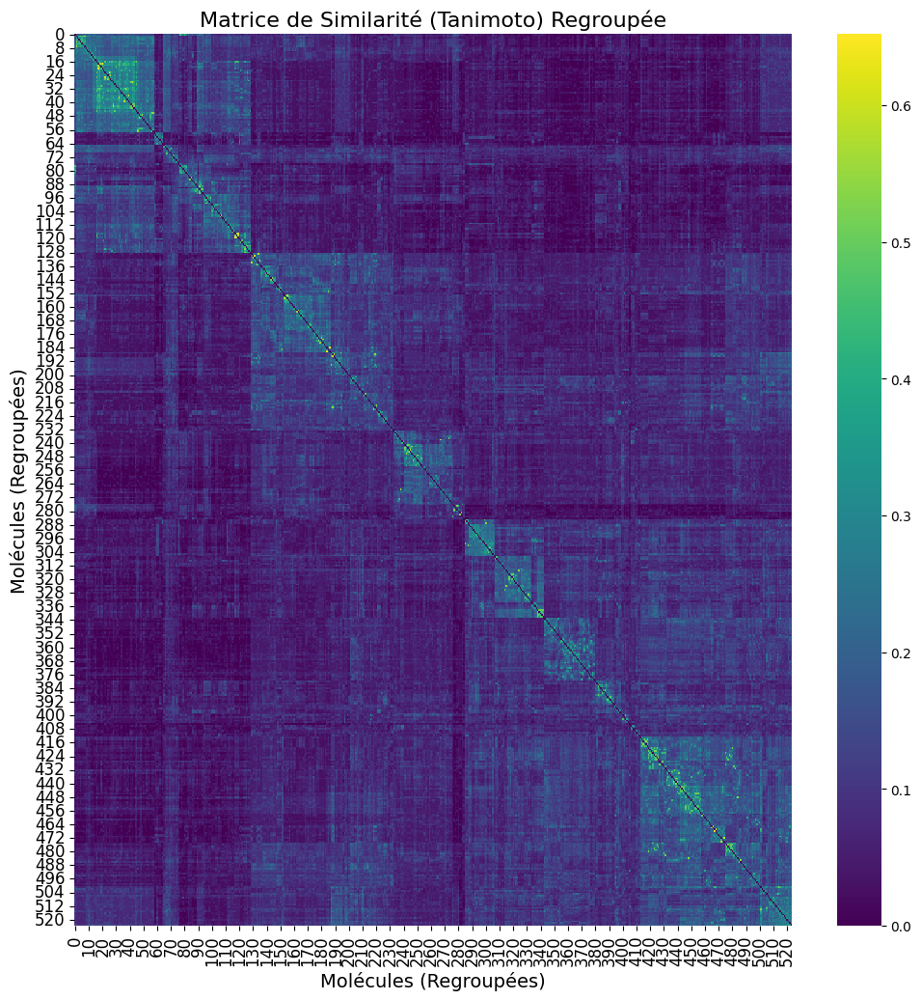

In [61]:
from scipy.cluster.hierarchy import linkage, dendrogram, leaves_list


# Calculer le clustering hiérarchique
linkage_matrix = linkage(1 - similarity_matrix, method='average')  # 1 - Similarité pour distance
ordered_indices = leaves_list(linkage_matrix)  # Ordre des indices des molécules après regroupement

# Réorganiser la matrice en fonction des clusters
clustered_matrix = similarity_matrix[ordered_indices][:, ordered_indices]

# Visualiser la matrice regroupée
plt.figure(figsize=(12, 12))
sns.heatmap(clustered_matrix, cmap="viridis", annot=False)
plt.title("Matrice de Similarité (Tanimoto) Regroupée", fontsize=16)
plt.xlabel("Molécules (Regroupées)", fontsize=14)
plt.ylabel("Molécules (Regroupées)", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()


In [63]:
!pip install plotly

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.1/19.1 MB 1.8 MB/s eta 0:00:00m eta 0:00:010:00:01


In [70]:
import plotly.express as px

# Convertir la matrice en DataFrame
similarity_df = pd.DataFrame(similarity_matrix)


# Créer une visualisation interactive
fig = px.imshow(similarity_df, color_continuous_scale='viridis', title="Matrice de Similarité (Tanimoto)")
fig.update_layout(width=800, height=800)
fig.show()


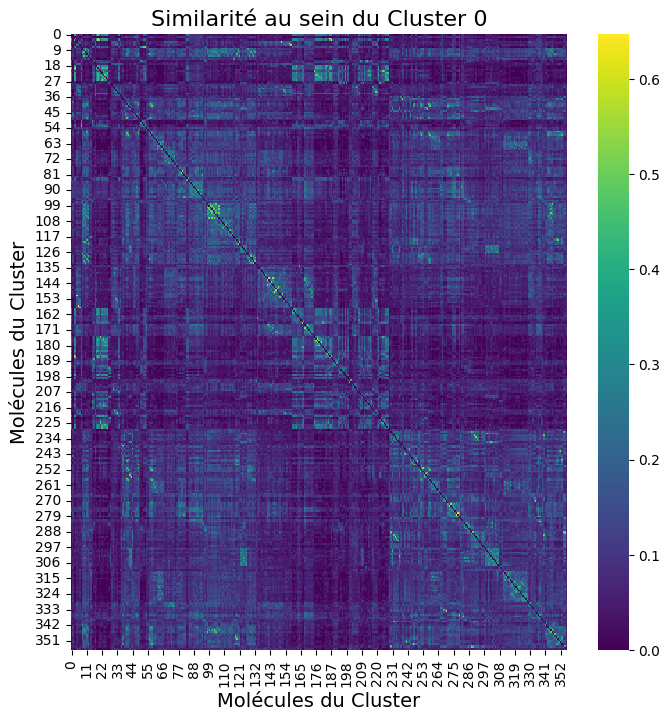

In [65]:
cluster_id = 0  # Exemple : analyser uniquement le cluster 0
cluster_indices = selected_molecules[selected_molecules['Cluster'] == cluster_id].index
cluster_matrix = similarity_matrix[np.ix_(cluster_indices, cluster_indices)]

plt.figure(figsize=(8, 8))
sns.heatmap(cluster_matrix, cmap="viridis", annot=False)
plt.title(f"Similarité au sein du Cluster {cluster_id}", fontsize=16)
plt.xlabel("Molécules du Cluster", fontsize=14)
plt.ylabel("Molécules du Cluster", fontsize=14)
plt.show()


In [66]:
similarity_df.to_csv("similarity_matrix.csv", index=False)


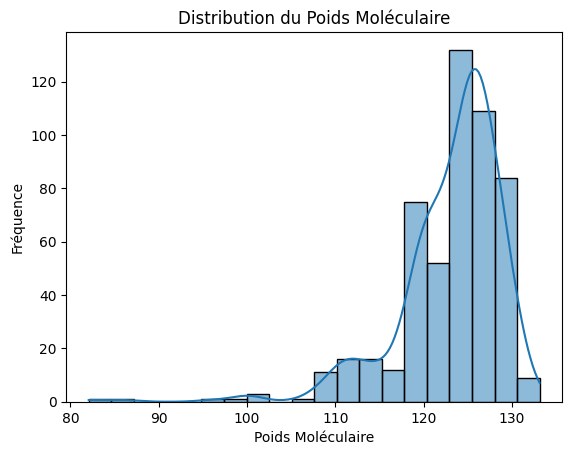

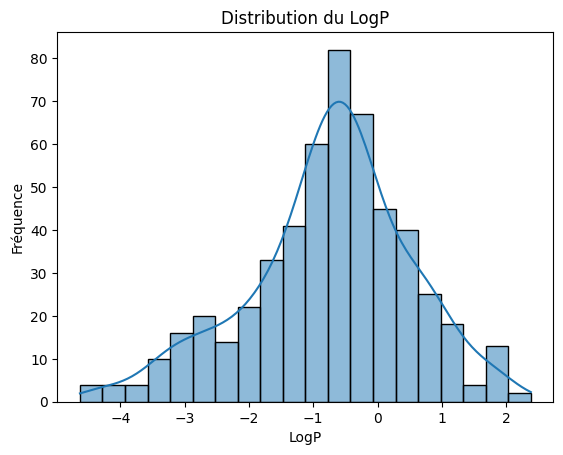

In [52]:
selected_molecules['Molecular_Weight'] = selected_molecules['smiles'].apply(lambda x: Descriptors.MolWt(Chem.MolFromSmiles(x)))
selected_molecules['LogP'] = selected_molecules['smiles'].apply(lambda x: Descriptors.MolLogP(Chem.MolFromSmiles(x)))

# Visualisation
sns.histplot(selected_molecules['Molecular_Weight'], bins=20, kde=True)
plt.title("Distribution du Poids Moléculaire")
plt.xlabel("Poids Moléculaire")
plt.ylabel("Fréquence")
plt.show()

sns.histplot(selected_molecules['LogP'], bins=20, kde=True)
plt.title("Distribution du LogP")
plt.xlabel("LogP")
plt.ylabel("Fréquence")
plt.show()


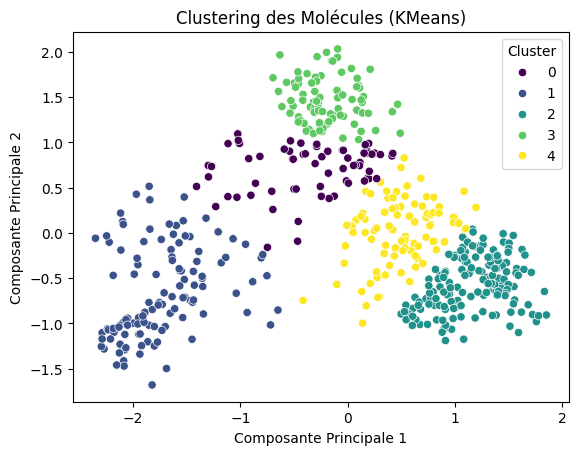

In [53]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# Réduction de dimension des fingerprints
pca = PCA(n_components=2)
fingerprint_2d = pca.fit_transform(fingerprints)

# Clustering
kmeans = KMeans(n_clusters=5, random_state=42).fit(fingerprint_2d)
selected_molecules['Cluster'] = kmeans.labels_

# Visualisation
sns.scatterplot(x=fingerprint_2d[:, 0], y=fingerprint_2d[:, 1], hue=selected_molecules['Cluster'], palette="viridis")
plt.title("Clustering des Molécules (KMeans)")
plt.xlabel("Composante Principale 1")
plt.ylabel("Composante Principale 2")
plt.show()


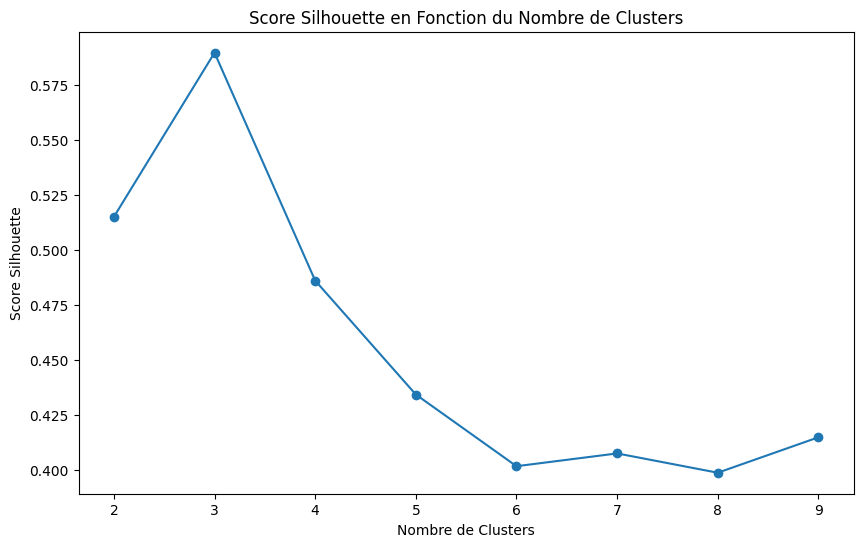

Nombre optimal de clusters : 3


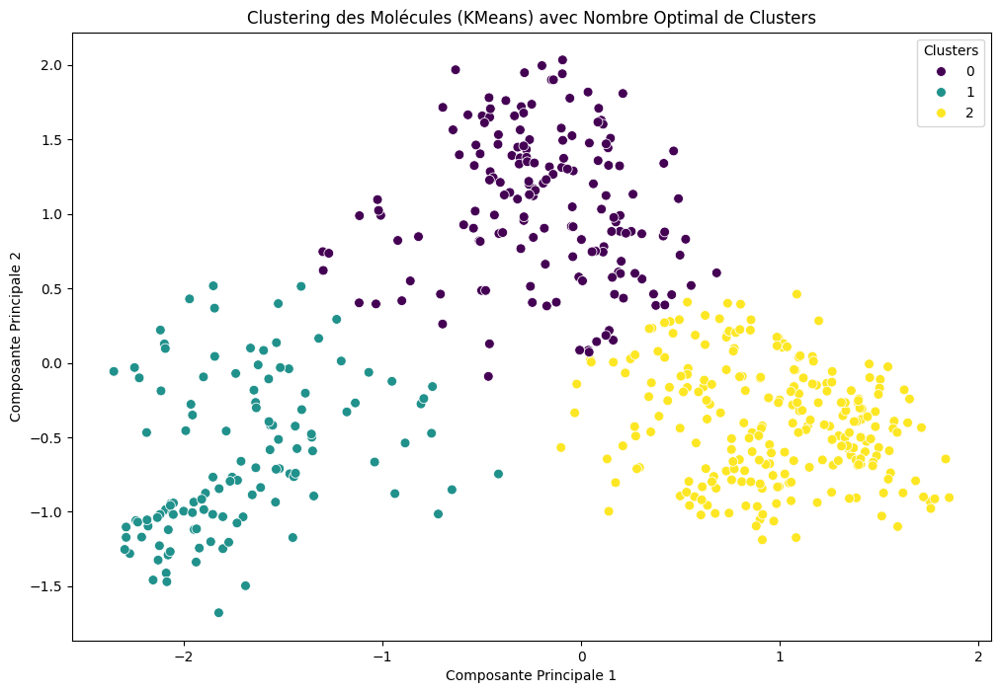

In [57]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import seaborn as sns

# Réduction de dimension des fingerprints
pca = PCA(n_components=2)
fingerprint_2d = pca.fit_transform(fingerprints)

# Trouver le nombre optimal de clusters
range_clusters = range(2, 10)  # Tester entre 2 et 10 clusters
silhouette_scores = []

for n_clusters in range_clusters:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    labels = kmeans.fit_predict(fingerprint_2d)
    score = silhouette_score(fingerprint_2d, labels)
    silhouette_scores.append(score)

# Visualiser les scores silhouette
plt.figure(figsize=(10, 6))
plt.plot(range_clusters, silhouette_scores, marker='o')
plt.title("Score Silhouette en Fonction du Nombre de Clusters")
plt.xlabel("Nombre de Clusters")
plt.ylabel("Score Silhouette")
plt.show()

# Nombre optimal de clusters
optimal_clusters = range_clusters[silhouette_scores.index(max(silhouette_scores))]
print(f"Nombre optimal de clusters : {optimal_clusters}")

# Appliquer KMeans avec le nombre optimal de clusters
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42)
selected_molecules['Cluster'] = kmeans.fit_predict(fingerprint_2d)

# Visualisation des clusters
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x=fingerprint_2d[:, 0], 
    y=fingerprint_2d[:, 1], 
    hue=selected_molecules['Cluster'], 
    palette="viridis",
    s=50
)
plt.title("Clustering des Molécules (KMeans) avec Nombre Optimal de Clusters")
plt.xlabel("Composante Principale 1")
plt.ylabel("Composante Principale 2")
plt.legend(title="Clusters")
plt.show()


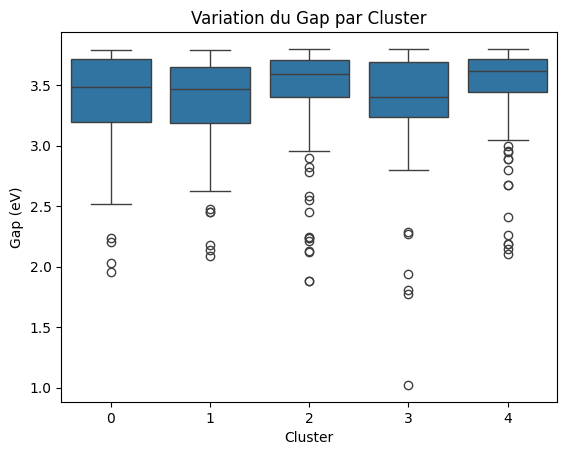

In [54]:
sns.boxplot(x='Cluster', y='Gap(eV)', data=selected_molecules)
plt.title("Variation du Gap par Cluster")
plt.xlabel("Cluster")
plt.ylabel("Gap (eV)")
plt.show()


Calcul des descripteurs Mordred...
Nettoyage des descripteurs Mordred...


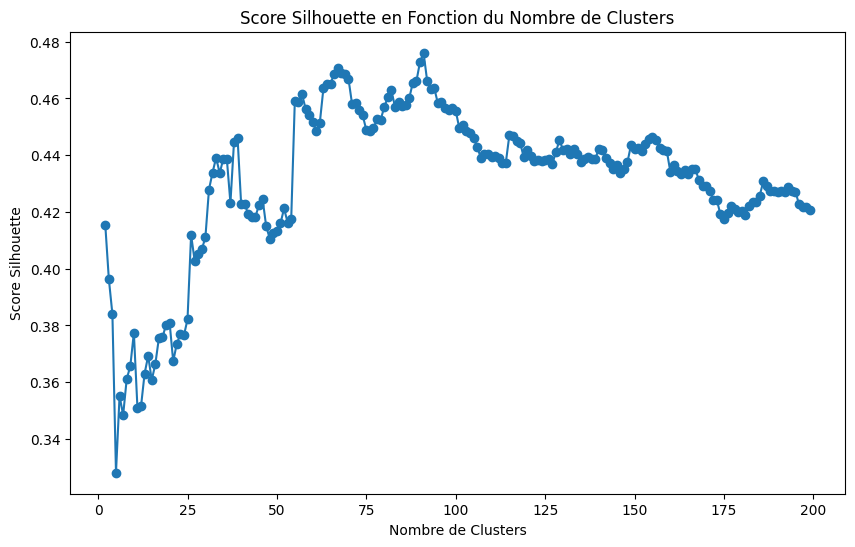

Nombre optimal de clusters : 91


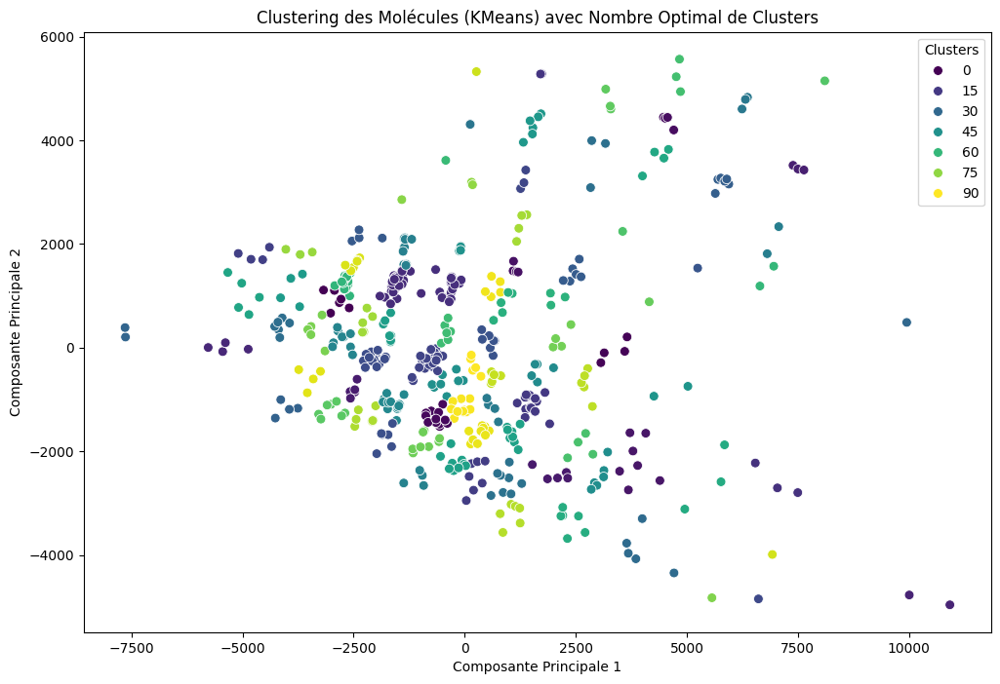

In [71]:
from mordred import Calculator, descriptors
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Fonction pour calculer les descripteurs Mordred
def calculate_mordred(smiles_list):
    """
    Calcule les descripteurs Mordred pour une liste de molécules SMILES.
    """
    calc = Calculator(descriptors, ignore_3D=True)
    descriptors_list = []
    for smiles in smiles_list:
        mol = Chem.MolFromSmiles(smiles)
        if mol is not None:
            descriptors_list.append(calc(mol))
        else:
            descriptors_list.append(None)
    return pd.DataFrame(descriptors_list)



# Calcul des descripteurs Mordred
print("Calcul des descripteurs Mordred...")
mordred_descriptors = calculate_mordred(selected_molecules['smiles'])

# Nettoyage des descripteurs Mordred (supprimer NaN et colonnes invariantes)
print("Nettoyage des descripteurs Mordred...")
mordred_descriptors = mordred_descriptors.select_dtypes(exclude=["object"])
mordred_descriptors.dropna(axis=1, inplace=True)  # Supprimer les colonnes avec des NaN
mordred_descriptors = mordred_descriptors.loc[:, mordred_descriptors.var() > 0]  # Supprimer les colonnes invariantes

# Réduction de dimension des descripteurs Mordred
pca = PCA(n_components=2)
mordred_2d = pca.fit_transform(mordred_descriptors)

# Trouver le nombre optimal de clusters
range_clusters = range(2, 200)  # Tester entre 2 et 10 clusters
silhouette_scores = []

for n_clusters in range_clusters:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    labels = kmeans.fit_predict(mordred_2d)
    score = silhouette_score(mordred_2d, labels)
    silhouette_scores.append(score)

# Visualiser les scores silhouette
plt.figure(figsize=(10, 6))
plt.plot(range_clusters, silhouette_scores, marker='o')
plt.title("Score Silhouette en Fonction du Nombre de Clusters")
plt.xlabel("Nombre de Clusters")
plt.ylabel("Score Silhouette")
plt.show()

# Nombre optimal de clusters
optimal_clusters = range_clusters[silhouette_scores.index(max(silhouette_scores))]
print(f"Nombre optimal de clusters : {optimal_clusters}")

# Appliquer KMeans avec le nombre optimal de clusters
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42)
selected_molecules['Cluster'] = kmeans.fit_predict(mordred_2d)

# Visualisation des clusters
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x=mordred_2d[:, 0], 
    y=mordred_2d[:, 1], 
    hue=selected_molecules['Cluster'], 
    palette="viridis",
    s=50
)
plt.title("Clustering des Molécules (KMeans) avec Nombre Optimal de Clusters")
plt.xlabel("Composante Principale 1")
plt.ylabel("Composante Principale 2")
plt.legend(title="Clusters")
plt.show()


In [4]:
import pandas as pd
df=pd.read_pickle('')

In [5]:
df

,smiles_key,smiles,HOMO,LUMO,Gap,HOMO(eV),LUMO(eV),Gap(eV),Scharber_Gap(eV)
0,gdb 326,O=CC(=O)C=O,-0.2606,-0.1455,0.1151,-7.091287,-3.959257,3.132031,3.132031
1,gdb 723,C1=NN=CN=N1,-0.2475,-0.1121,0.1355,-6.734818,-3.050396,3.687143,3.687143
2,gdb 1587,CC(=O)C(=O)C=O,-0.2489,-0.1149,0.1340,-6.772914,-3.126588,3.646326,3.646326
3,gdb 1589,NC(=O)C(=O)C=O,-0.2482,-0.1217,0.1265,-6.753866,-3.311626,3.442240,3.442240
4,gdb 2115,O=C1CC=CC1=O,-0.2347,-0.0951,0.1396,-6.386512,-2.587803,3.798709,3.798709
...,...,...,...,...,...,...,...,...,...
519,gdb 133853,OC12C3C1N1CC3N=C21,-0.2087,-0.0889,0.1198,-5.679016,-2.419092,3.259924,3.259924
520,gdb 133854,CC12CC34CC=C(C13)C24,-0.1575,-0.0912,0.0663,-4.285793,-2.481678,1.804115,1.804115
521,gdb 133858,CC1N2C3C4=CCC13C24,-0.1693,-0.1041,0.0652,-4.606888,-2.832705,1.774182,1.774182
522,gdb 133864,C1C2CC3OC4CC1C234,-0.1386,-0.0638,0.0747,-3.771498,-1.736086,2.032691,2.032691


In [8]:
import os
import shutils

import re

# 📂 Définition des chemins
input_csv = "filtered_molecules.pkl"  # Remplacez par le chemin de votre fichier CSV
source_folder = "GDB-V2024"  # Dossier contenant tous les fichiers .xyz
destination_folder = "GDB9_XYZ"  # Dossier où stocker les fichiers extraits

# 📂 Création du dossier de sortie s'il n'existe pas
os.makedirs(destination_folder, exist_ok=True)

# 📄 Chargement du DataFrame contenant les identifiants
df = pd.read_pickle(input_csv)

# 🔍 Extraction des identifiants entiers après "gdb" dans smiles_key
df["identifier"] = df["smiles_key"].str.extract(r'gdb\s*(\d+)', expand=False).astype(str)

# 🔍 Recherche et copie des fichiers correspondant aux identifiants
for identifier in df["identifier"].dropna().unique():
    xyz_filename = f"GDB{identifier}.xyz"
    source_path = os.path.join(source_folder, xyz_filename)
    destination_path = os.path.join(destination_folder, xyz_filename)

    # 📂 Vérifier si le fichier existe avant de le copier
    if os.path.exists(source_path):
        shutil.copy(source_path, destination_path)
        print(f"✅ Fichier {xyz_filename} copié dans {destination_folder}")
    else:
        print(f"⚠️ Fichier {xyz_filename} non trouvé dans {source_folder}")

print("\n🔹 Extraction des fichiers XYZ terminée !")


✅ Fichier GDB326.xyz copié dans GDB9_XYZ
✅ Fichier GDB723.xyz copié dans GDB9_XYZ
✅ Fichier GDB1587.xyz copié dans GDB9_XYZ
✅ Fichier GDB1589.xyz copié dans GDB9_XYZ
✅ Fichier GDB2115.xyz copié dans GDB9_XYZ
✅ Fichier GDB2124.xyz copié dans GDB9_XYZ
✅ Fichier GDB2125.xyz copié dans GDB9_XYZ
✅ Fichier GDB4019.xyz copié dans GDB9_XYZ
✅ Fichier GDB4605.xyz copié dans GDB9_XYZ
✅ Fichier GDB4608.xyz copié dans GDB9_XYZ
✅ Fichier GDB4611.xyz copié dans GDB9_XYZ
✅ Fichier GDB4613.xyz copié dans GDB9_XYZ
✅ Fichier GDB4618.xyz copié dans GDB9_XYZ
✅ Fichier GDB4807.xyz copié dans GDB9_XYZ
✅ Fichier GDB5034.xyz copié dans GDB9_XYZ
✅ Fichier GDB6059.xyz copié dans GDB9_XYZ
✅ Fichier GDB6273.xyz copié dans GDB9_XYZ
✅ Fichier GDB6683.xyz copié dans GDB9_XYZ
✅ Fichier GDB7902.xyz copié dans GDB9_XYZ
✅ Fichier GDB8721.xyz copié dans GDB9_XYZ
✅ Fichier GDB8723.xyz copié dans GDB9_XYZ
✅ Fichier GDB8779.xyz copié dans GDB9_XYZ
✅ Fichier GDB8786.xyz copié dans GDB9_XYZ
✅ Fichier GDB8792.xyz copié dans GDB